# Problem Statement

The major objective of this data set is to extract actionable insights from the historical match data and make strategic 
changes to make India win. Primary objective is to create Machine Learning models which 
correctly predicts a win for the Indian Cricket Team. Once a model is developed then you have 
to extract actionable insights and recommendation.

# Import Libraries

In [246]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns # for making plots with seaborn
import sklearn.metrics as metrics
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [247]:
print('Numpy Version',np.__version__)
print('Pandas Version',pd.__version__)
print('Seaborn Version',sns.__version__)
print('Matplotlib Version',matplotlib.__version__)

Numpy Version 1.21.3
Pandas Version 1.3.4
Seaborn Version 0.11.1
Matplotlib Version 3.4.3


# Import Data

In [248]:
df=pd.read_excel('Sports+Data.xlsx',sheet_name=1)

# Data Info - Types of Features

In [249]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 23 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Game_number             2930 non-null   object 
 1   Result                  2930 non-null   object 
 2   Avg_team_Age            2833 non-null   float64
 3   Match_light_type        2878 non-null   object 
 4   Match_format            2860 non-null   object 
 5   Bowlers_in_team         2848 non-null   float64
 6   Wicket_keeper_in_team   2930 non-null   int64  
 7   All_rounder_in_team     2890 non-null   float64
 8   First_selection         2871 non-null   object 
 9   Opponent                2894 non-null   object 
 10  Season                  2868 non-null   object 
 11  Audience_number         2849 non-null   float64
 12  Offshore                2866 non-null   object 
 13  Max_run_scored_1over    2902 non-null   float64
 14  Max_wicket_taken_1over  2930 non-null   

# Data Head 

In [250]:
df.head(11).T

,0,1,2,3,4,5,6,7,8,9,10
Game_number,Game_1,Game_2,Game_3,Game_4,Game_5,Game_6,Game_7,Game_8,Game_9,Game_10,Game_11
Result,Loss,Win,Loss,Win,Loss,Win,Loss,Win,Loss,Win,Loss
Avg_team_Age,18.00,24.00,24.00,24.00,24.00,24.00,24.00,24.00,24.00,24.00,24.00
Match_light_type,Day,Day,Day and Night,NaN,Night,Night,Day and Night,Night,Day,Day,Day and Night
Match_format,ODI,T20,T20,ODI,ODI,ODI,T20,ODI,ODI,T20,T20
Bowlers_in_team,3.00,3.00,3.00,2.00,1.00,3.00,2.00,3.00,3.00,3.00,3.00
Wicket_keeper_in_team,1,1,1,1,1,1,1,1,1,1,1
All_rounder_in_team,3.00,4.00,2.00,2.00,3.00,4.00,2.00,2.00,3.00,4.00,2.00
First_selection,Bowling,Batting,Bowling,Bowling,Bowling,Batting,Batting,Batting,Bowling,Batting,Bowling
Opponent,Srilanka,Zimbabwe,Zimbabwe,Kenya,Srilanka,Srilanka,Zimbabwe,Kenya,Srilanka,Zimbabwe,Zimbabwe


In [252]:
df.describe()

,Avg_team_Age,Bowlers_in_team,Wicket_keeper_in_team,All_rounder_in_team,Audience_number,Max_run_scored_1over,Max_wicket_taken_1over,Extra_bowls_bowled,Min_run_given_1over,Min_run_scored_1over,Max_run_given_1over,extra_bowls_opponent,player_highest_run
count,2833.00,2848.00,2930.00,2890.00,2849.00,2902.00,2930.00,2901.00,2930.00,2903.00,2896.00,2930.00,2902.00
mean,29.24,2.91,1.00,2.72,46267.96,15.20,2.71,11.25,1.95,2.76,8.67,4.23,65.89
std,2.26,1.02,0.00,1.09,48599.58,3.66,1.08,7.78,1.68,0.71,5.00,3.63,20.33
min,12.00,1.00,1.00,1.00,7063.00,11.00,1.00,0.00,0.00,1.00,6.00,0.00,30.00
25%,30.00,2.00,1.00,2.00,20363.00,12.00,2.00,6.00,0.00,2.00,6.00,2.00,48.00
50%,30.00,3.00,1.00,3.00,34349.00,14.00,3.00,10.00,2.00,3.00,6.00,3.00,66.00
75%,30.00,4.00,1.00,4.00,57876.00,18.00,4.00,15.00,3.00,3.00,9.25,7.00,84.00
max,70.00,5.00,1.00,4.00,1399930.00,25.00,4.00,40.00,6.00,4.00,40.00,18.00,100.00


# Check shape of data

In [251]:
print('The number of rows (observations) is',df.shape[0],'\n''The number of columns (variables) is',df.shape[1])

The number of rows (observations) is 2930 
The number of columns (variables) is 23


# Delete Variables Not Meaningful to Analysis

In [253]:
df.drop(['Game_number','Wicket_keeper_in_team'],axis=1,inplace=True)

# Measures of Central Tendency

In [254]:
pd.set_option('max_rows', None)
pd.options.display.float_format = '{:.2f}'.format   
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Result,2930,2,Win,2457,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Avg_team_Age,2833.00,NaN,NaN,NaN,29.24,2.26,12.00,30.00,30.00,30.00,70.00
Match_light_type,2878,3,Day,2041,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Match_format,2860,4,ODI,1865,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bowlers_in_team,2848.00,NaN,NaN,NaN,2.91,1.02,1.00,2.00,3.00,4.00,5.00
All_rounder_in_team,2890.00,NaN,NaN,NaN,2.72,1.09,1.00,2.00,3.00,4.00,4.00
First_selection,2871,3,Bowling,1722,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Opponent,2894,9,South Africa,640,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Season,2868,3,Rainy,1309,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Audience_number,2849.00,NaN,NaN,NaN,46267.96,48599.58,7063.00,20363.00,34349.00,57876.00,1399930.00


# Unique Value of Categorical Variables

In [255]:
for column in df.columns:
    if df[column].dtype == 'object':
        print(column,': ',df[column].nunique())
        print(df[column].value_counts().sort_values())
        print('\n')

Result :  2
Loss     473
Win     2457
Name: Result, dtype: int64


Match_light_type :  3
Night             296
Day and Night     541
Day              2041
Name: Match_light_type, dtype: int64


Match_format :  4
20-20       6
Test      125
T20       864
ODI      1865
Name: Match_format, dtype: int64


First_selection :  3
Bat          11
Batting    1138
Bowling    1722
Name: First_selection, dtype: int64


Opponent :  9
Australia       104
West Indies     158
Zimbabwe        163
Bangladesh      204
Pakistan        253
England         283
Srilanka        513
Kenya           576
South Africa    640
Name: Opponent, dtype: int64


Season :  3
Winter     641
Summer     918
Rainy     1309
Name: Season, dtype: int64


Offshore :  2
Yes     809
No     2057
Name: Offshore, dtype: int64


Players_scored_zero :  5
Three       5
1         166
4         285
2         744
3        1730
Name: Players_scored_zero, dtype: int64


player_highest_wicket :  6
Three       7
5         138
4         211
3   

## Fix Column Values - Columns with String and Numeric Data Both

In [256]:
df['player_highest_wicket']=df['player_highest_wicket'].replace(to_replace='Three',value=3)

In [257]:
df['Players_scored_zero'] = df['Players_scored_zero'].replace(to_replace='Three',value=3)

In [258]:
df['First_selection'] = df['First_selection'].replace(to_replace='Bat',value='Batting')

In [259]:
df['Match_light_type'] = df['Match_light_type'].replace(to_replace='Night',value='Day and Night')

In [260]:
df['Match_format'] = df['Match_format'].replace(to_replace='20-20',value='T20')

In [261]:
for column in df.columns:
    if df[column].dtype == 'object':
        print(column,': ',df[column].nunique())
        print(df[column].value_counts().sort_values())
        print('\n')

Result :  2
Loss     473
Win     2457
Name: Result, dtype: int64


Match_light_type :  2
Day and Night     837
Day              2041
Name: Match_light_type, dtype: int64


Match_format :  3
Test     125
T20      870
ODI     1865
Name: Match_format, dtype: int64


First_selection :  2
Batting    1149
Bowling    1722
Name: First_selection, dtype: int64


Opponent :  9
Australia       104
West Indies     158
Zimbabwe        163
Bangladesh      204
Pakistan        253
England         283
Srilanka        513
Kenya           576
South Africa    640
Name: Opponent, dtype: int64


Season :  3
Winter     641
Summer     918
Rainy     1309
Name: Season, dtype: int64


Offshore :  2
Yes     809
No     2057
Name: Offshore, dtype: int64




In [262]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Result                  2930 non-null   object 
 1   Avg_team_Age            2833 non-null   float64
 2   Match_light_type        2878 non-null   object 
 3   Match_format            2860 non-null   object 
 4   Bowlers_in_team         2848 non-null   float64
 5   All_rounder_in_team     2890 non-null   float64
 6   First_selection         2871 non-null   object 
 7   Opponent                2894 non-null   object 
 8   Season                  2868 non-null   object 
 9   Audience_number         2849 non-null   float64
 10  Offshore                2866 non-null   object 
 11  Max_run_scored_1over    2902 non-null   float64
 12  Max_wicket_taken_1over  2930 non-null   int64  
 13  Extra_bowls_bowled      2901 non-null   float64
 14  Min_run_given_1over     2930 non-null   

In [263]:
pd.set_option('max_rows', None)
pd.options.display.float_format = '{:.2f}'.format   
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Result,2930,2,Win,2457,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Avg_team_Age,2833.00,NaN,NaN,NaN,29.24,2.26,12.00,30.00,30.00,30.00,70.00
Match_light_type,2878,2,Day,2041,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Match_format,2860,3,ODI,1865,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Bowlers_in_team,2848.00,NaN,NaN,NaN,2.91,1.02,1.00,2.00,3.00,4.00,5.00
All_rounder_in_team,2890.00,NaN,NaN,NaN,2.72,1.09,1.00,2.00,3.00,4.00,4.00
First_selection,2871,2,Bowling,1722,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Opponent,2894,9,South Africa,640,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Season,2868,3,Rainy,1309,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Audience_number,2849.00,NaN,NaN,NaN,46267.96,48599.58,7063.00,20363.00,34349.00,57876.00,1399930.00


# Outlier detection and treatment

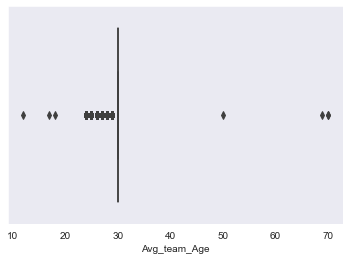

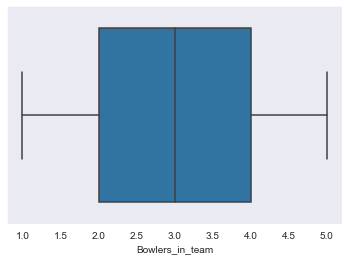

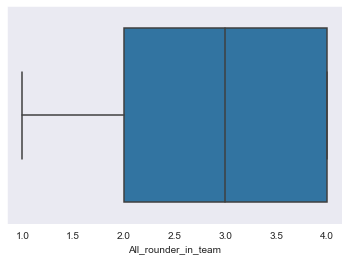

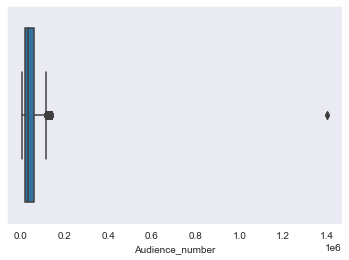

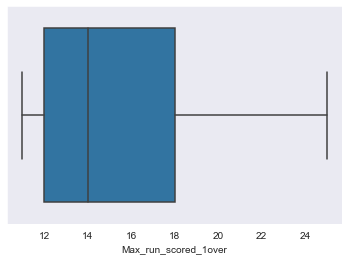

...

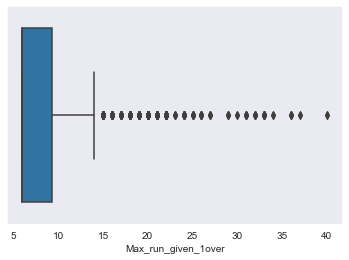

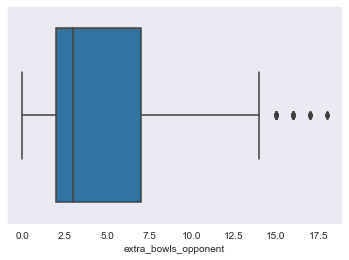

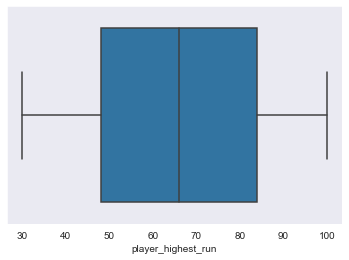

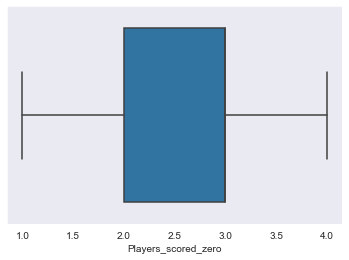

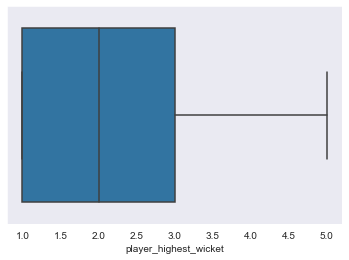

In [264]:
col_names = list(df.select_dtypes(exclude=['object']).columns)
#fig, ax = plt.subplots(len(col_names), figsize=(5,50))
for i,col_val in enumerate(col_names):
    sns.boxplot(df[col_val])
    ax[i].set_title('{}'.format(col_val), fontsize=8)
    plt.show()


# Outlier Treatment

In [265]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range    

In [266]:
for i,col_val in enumerate(col_names):
    lwr,upr=remove_outlier(df[col_val])
    df[col_val]=np.where(df[col_val]>upr,upr,df[col_val])
    df[col_val]=np.where(df[col_val]<lwr,lwr,df[col_val])
    print("Outlier fixed for ", col_val)


Outlier fixed for  Avg_team_Age
Outlier fixed for  Bowlers_in_team
Outlier fixed for  All_rounder_in_team
Outlier fixed for  Audience_number
Outlier fixed for  Max_run_scored_1over
Outlier fixed for  Max_wicket_taken_1over
Outlier fixed for  Extra_bowls_bowled
Outlier fixed for  Min_run_given_1over
Outlier fixed for  Min_run_scored_1over
Outlier fixed for  Max_run_given_1over
Outlier fixed for  extra_bowls_opponent
Outlier fixed for  player_highest_run
Outlier fixed for  Players_scored_zero
Outlier fixed for  player_highest_wicket


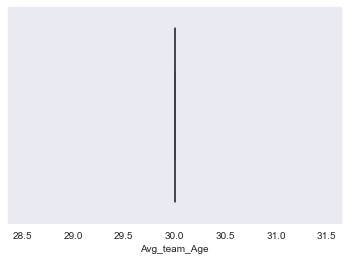

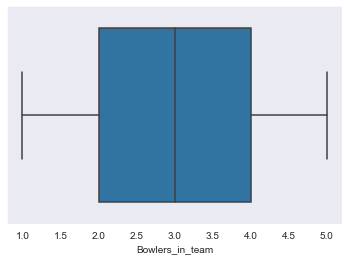

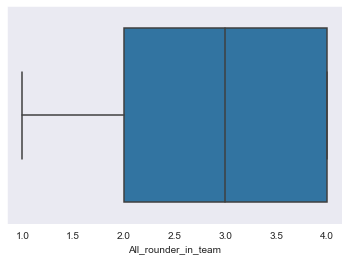

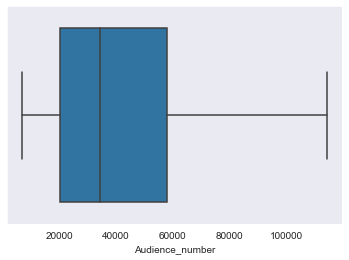

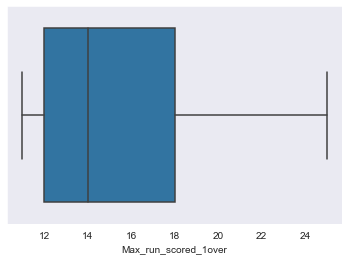

...

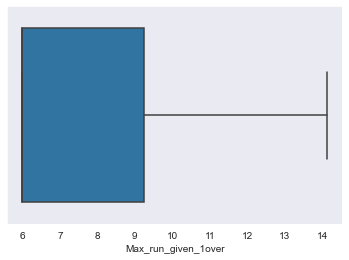

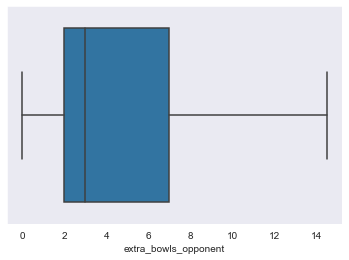

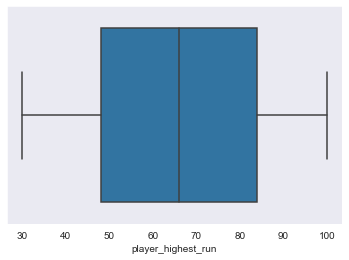

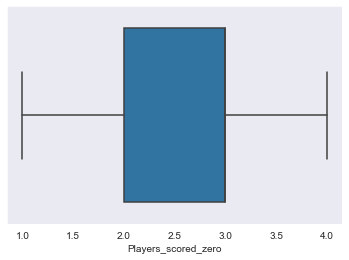

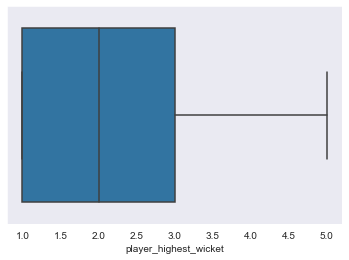

In [267]:
for i,col_val in enumerate(col_names):
    sns.boxplot(df[col_val])
    ax[i].set_title('{}'.format(col_val), fontsize=8)
    plt.show()

# Uni Variate Analysis

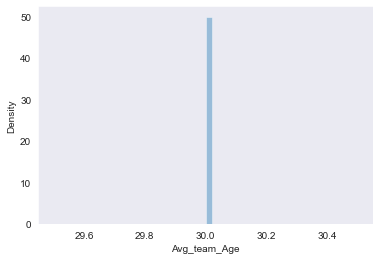

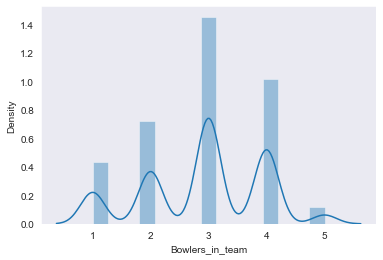

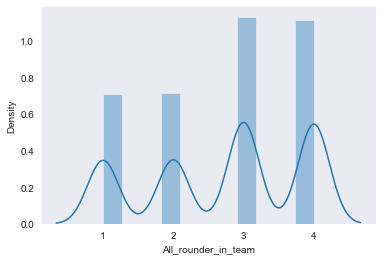

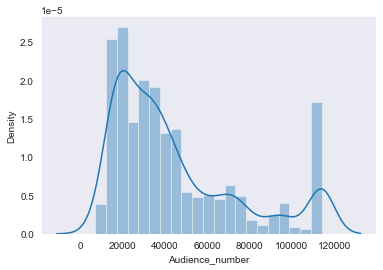

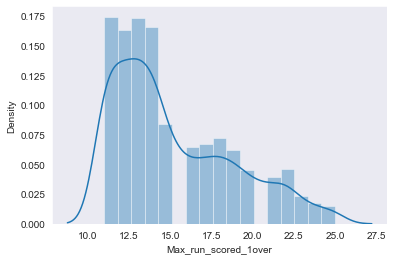

...

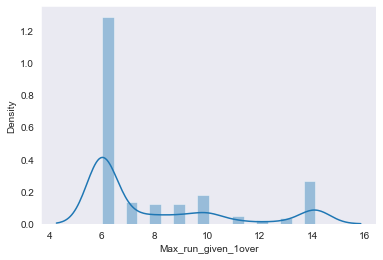

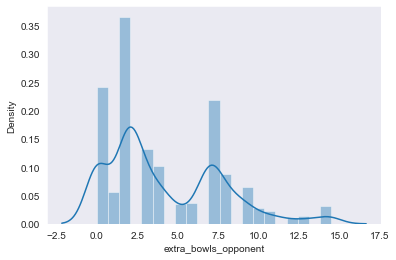

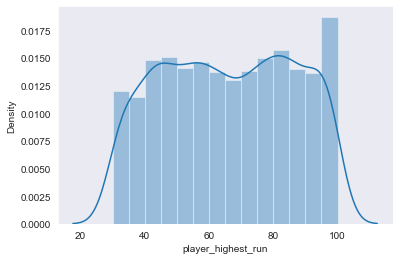

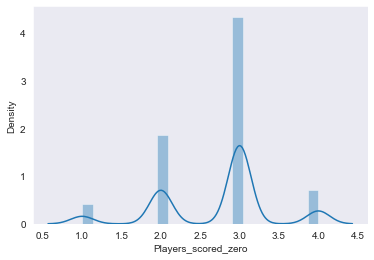

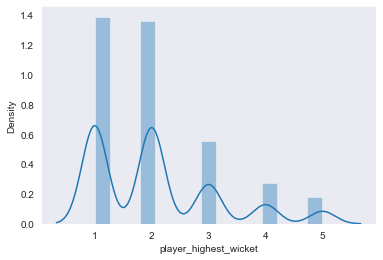

In [268]:
for i,col_val in enumerate(col_names):
    sns.distplot(df[col_val])
    plt.show()

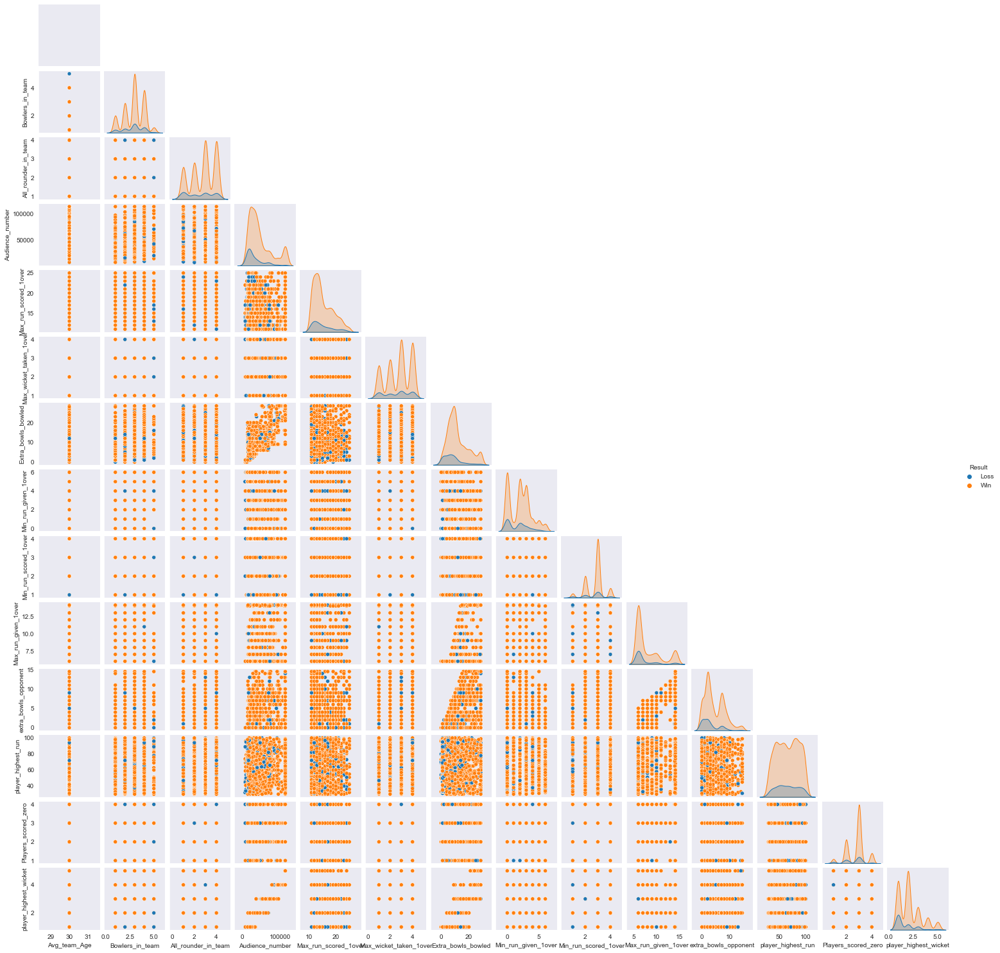

In [269]:
sns.set_style("dark")
sns.pairplot(df,hue="Result",height=1.5,aspect=1,corner=True)

In [ ]:
sns.set_style("dark")
sns.pairplot(df,hue="Match_format",height=1.5,aspect=1,corner=True)

# BI Variate Analysis

## Outcome of Match

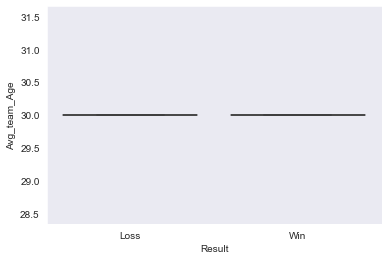

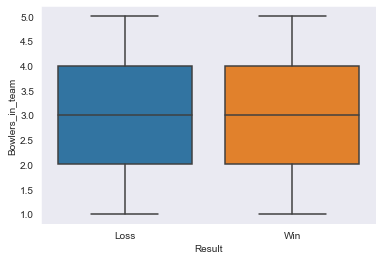

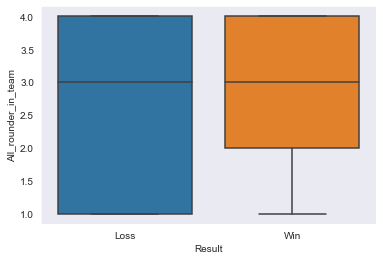

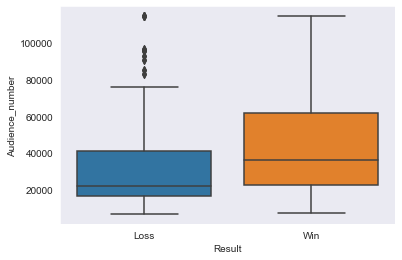

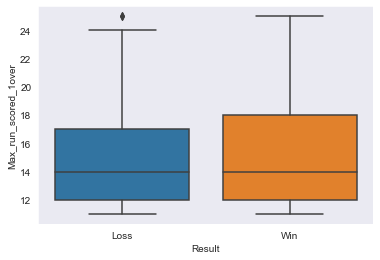

...

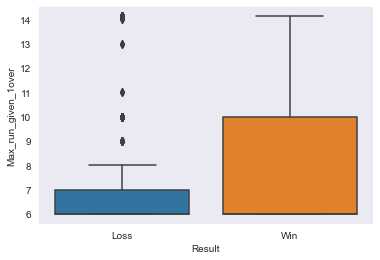

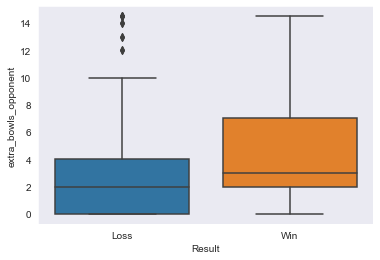

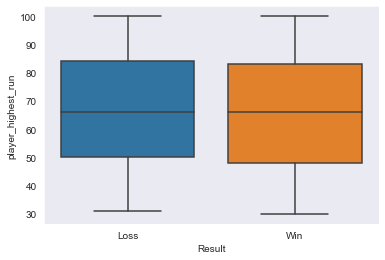

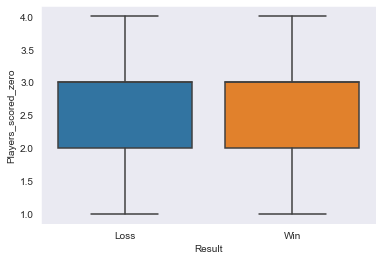

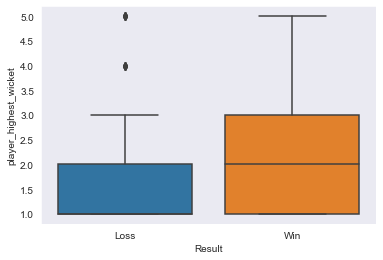

In [270]:
#col_names = list(df.select_dtypes(exclude=['object']).columns)
#fig, ax = plt.subplots(len(col_names), figsize=(5,65))
for i,col_val in enumerate(col_names):
    #print (df[col_val].dtype)
    sns.boxplot(y=df[col_val],x=df.Result)
    #ax[i].set_title('{}'.format(col_val), fontsize=8)
    plt.show()


## Home Conditions

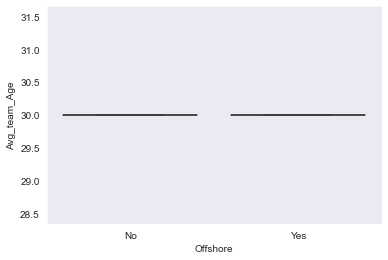

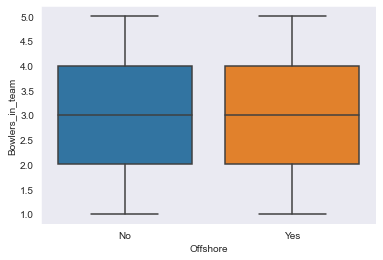

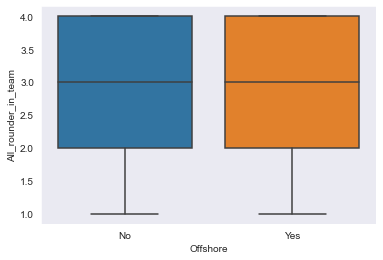

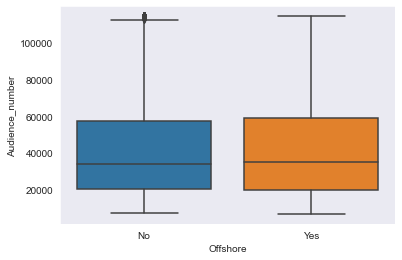

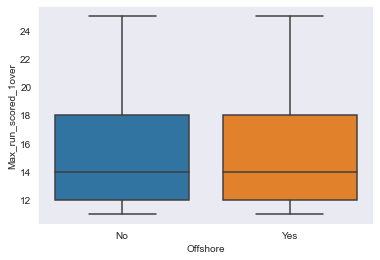

...

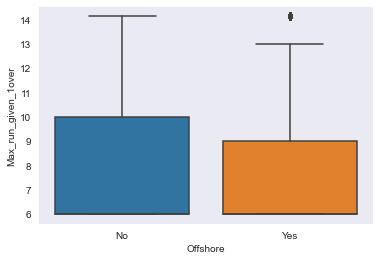

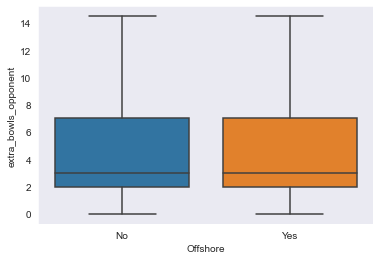

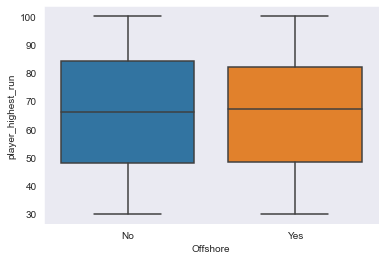

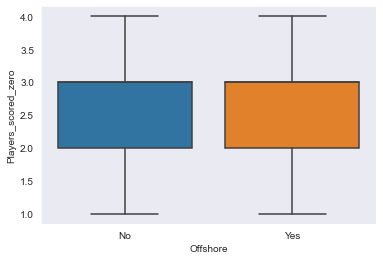

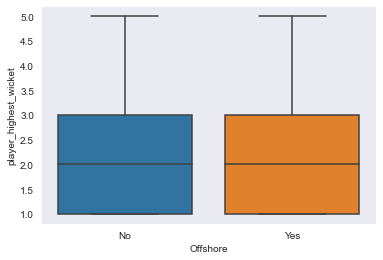

In [271]:
#fig, ax = plt.subplots(len(col_names), figsize=(5,65))
for i,col_val in enumerate(col_names):
    #print (df[col_val].dtype)
    sns.boxplot(y=df[col_val],x=df.Offshore)
    #ax[i].set_title('{}'.format(col_val), fontsize=8)
    plt.show()

## First Selection

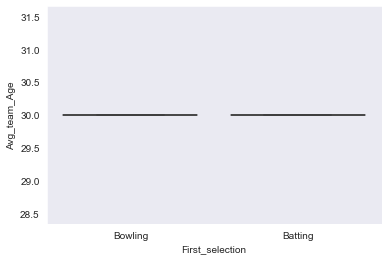

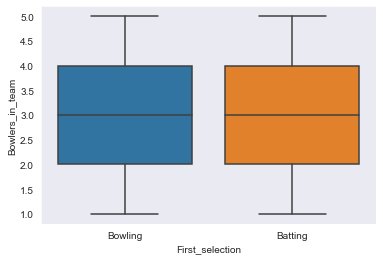

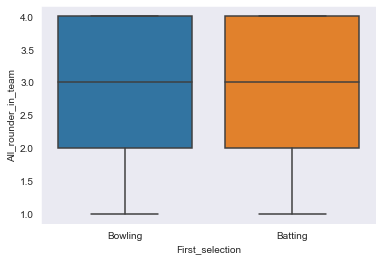

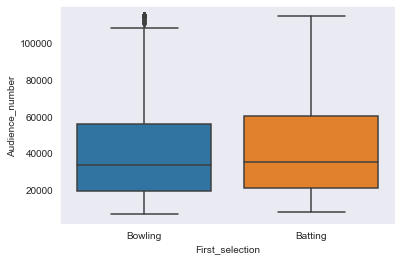

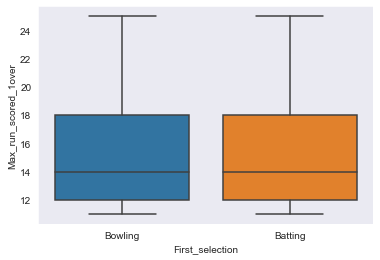

...

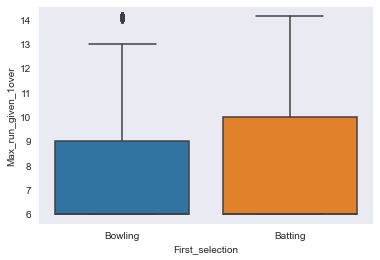

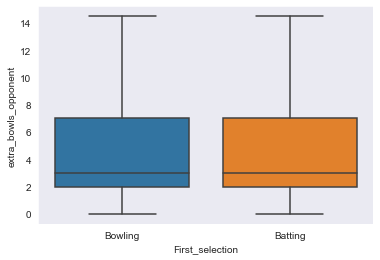

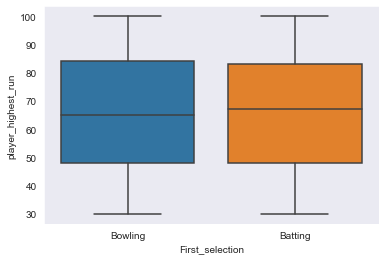

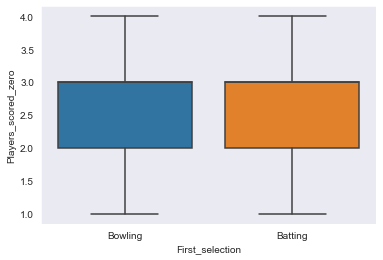

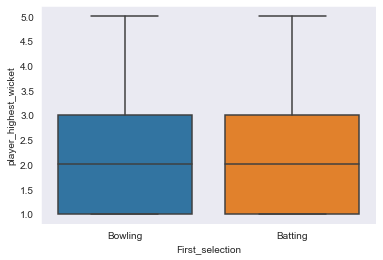

In [272]:
#fig, ax = plt.subplots(len(col_names), figsize=(5,65))
for i,col_val in enumerate(col_names):
    #print (df[col_val].dtype)
    sns.boxplot(y=df[col_val],x=df.First_selection)
    plt.show()
    #ax[i].set_title('{}'.format(col_val), fontsize=8)

## Opponent

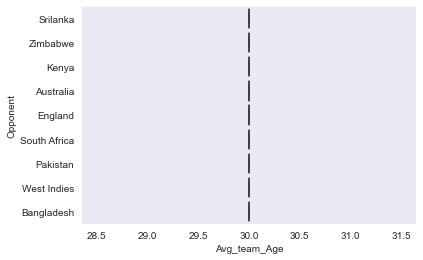

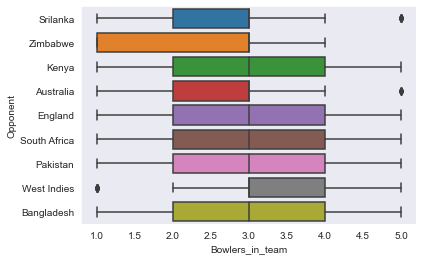

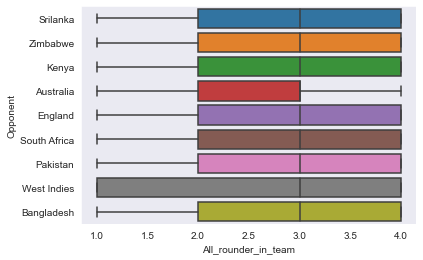

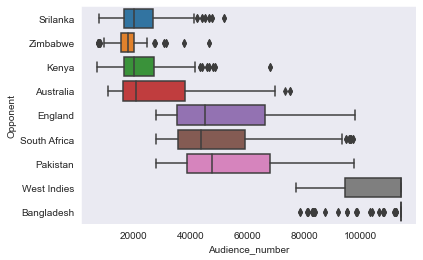

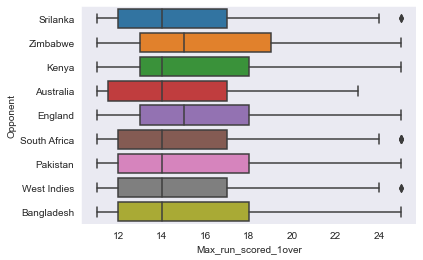

...

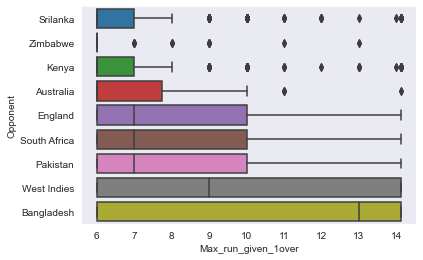

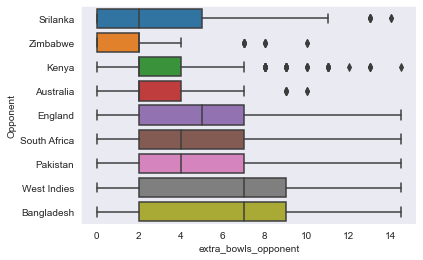

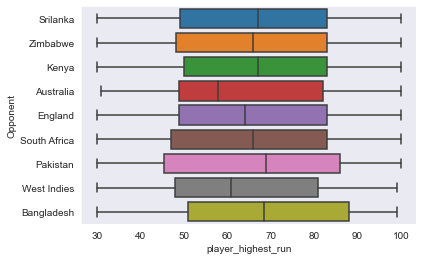

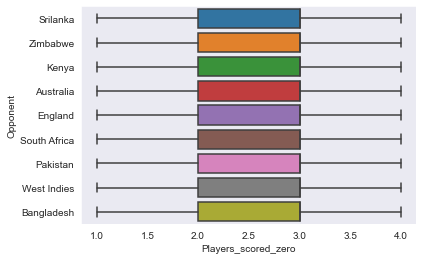

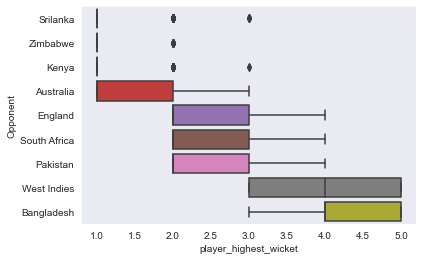

In [273]:
#fig, ax = plt.subplots(len(col_names), figsize=(5,65))
for i,col_val in enumerate(col_names):
    #print (df[col_val].dtype)
    sns.boxplot(x=df[col_val],y=df.Opponent,orient="h")
    plt.show()
    #ax[i].set_title('{}'.format(col_val), fontsize=8)

## Season

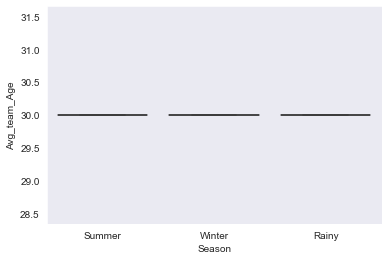

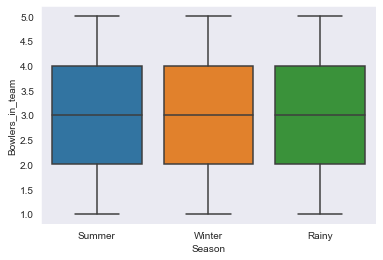

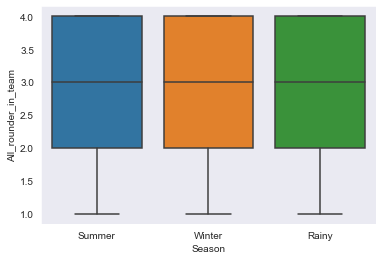

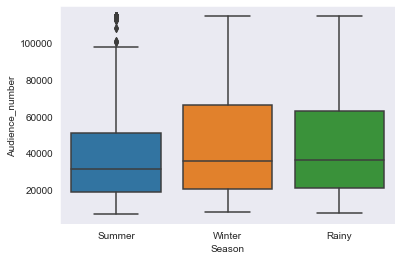

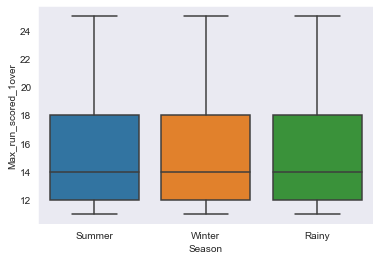

...

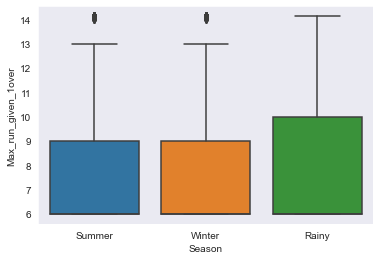

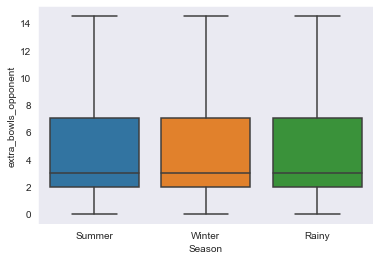

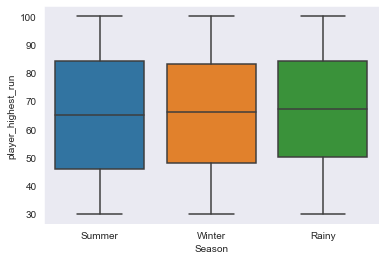

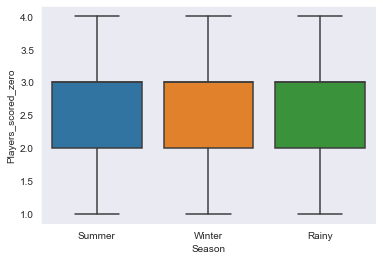

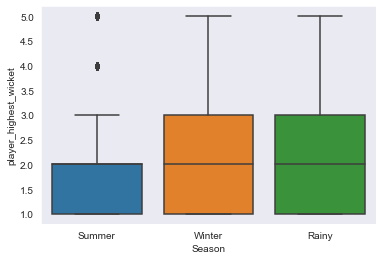

In [274]:
#fig, ax = plt.subplots(len(col_names), figsize=(5,65))
for i,col_val in enumerate(col_names):
    #print (df[col_val].dtype)
    sns.boxplot(y=df[col_val],x=df.Season)
    plt.show()
    #ax[i].set_title('{}'.format(col_val), fontsize=8)

## Match Format

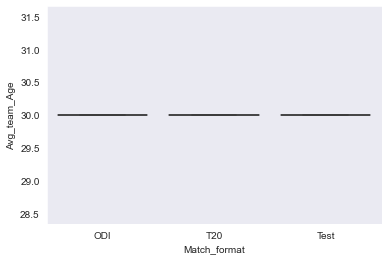

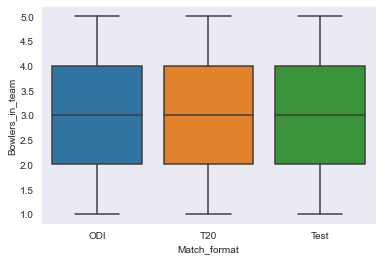

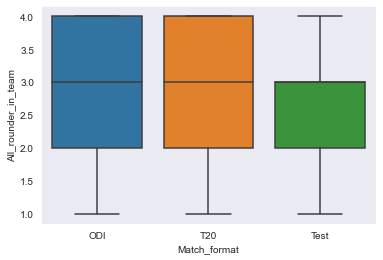

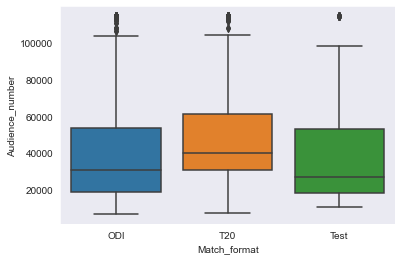

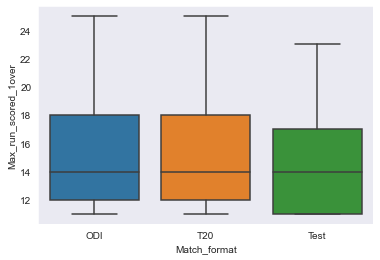

...

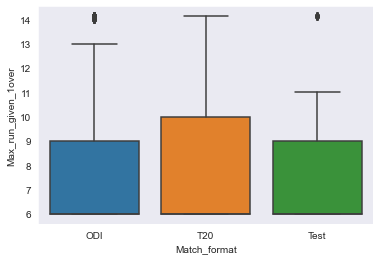

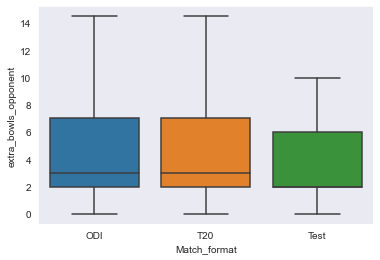

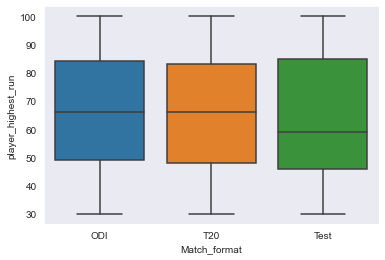

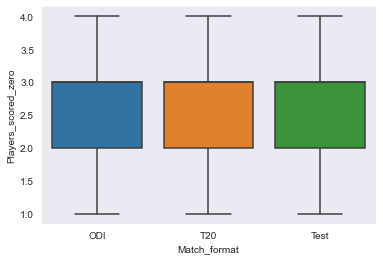

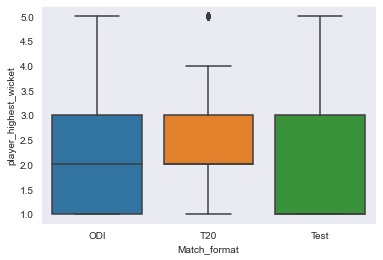

In [275]:
#fig, ax = plt.subplots(len(col_names), figsize=(5,65))
for i,col_val in enumerate(col_names):
    #print (df[col_val].dtype)
    sns.boxplot(y=df[col_val],x=df.Match_format)
    plt.show()
    #ax[i].set_title('{}'.format(col_val), fontsize=8)

## Scatter Plot for Bi Variate Analysis

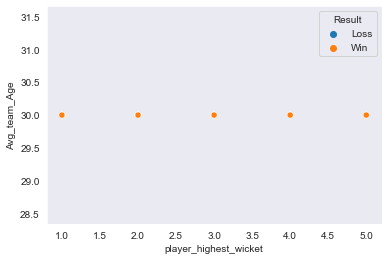

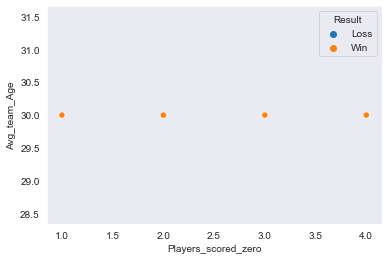

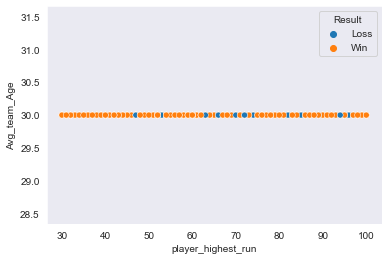

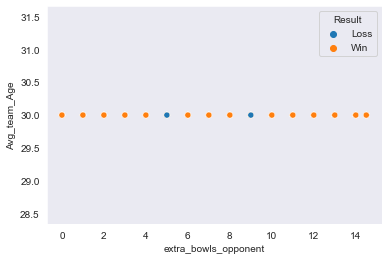

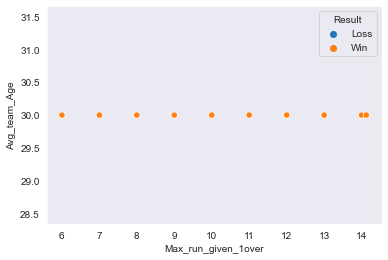

...

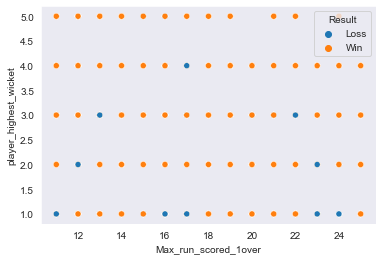

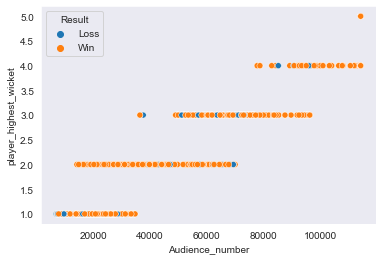

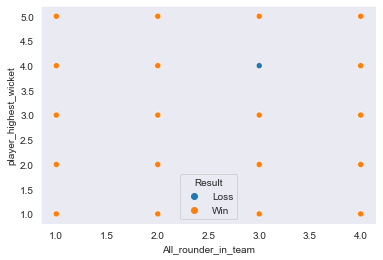

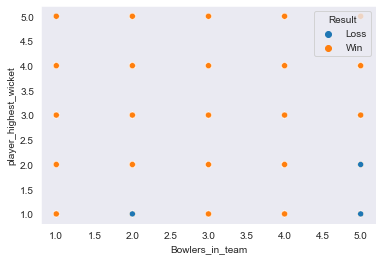

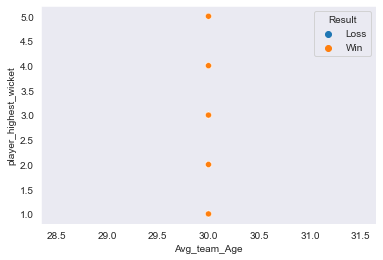

In [276]:
#fig, ax = plt.subplots(len(col_names), figsize=(5,70))
for i,col_val in enumerate(col_names):
    for j,rev_col in reversed(list(enumerate(col_names))):
        sns.scatterplot(y=df[col_val],x=df[rev_col],hue=df.Result)
        #ax[i].set_title('{}'.format(col_val,rev_col), fontsize=8)
        plt.show()

# Zero value check

In [277]:
df.eq(0).any().sum()

3

There are three features with 0 values

In [278]:
df.eq(0).sum()

Result                      0
Avg_team_Age                0
Match_light_type            0
Match_format                0
Bowlers_in_team             0
All_rounder_in_team         0
First_selection             0
Opponent                    0
Season                      0
Audience_number             0
Offshore                    0
Max_run_scored_1over        0
Max_wicket_taken_1over      0
Extra_bowls_bowled         22
Min_run_given_1over       953
Min_run_scored_1over        0
Max_run_given_1over         0
extra_bowls_opponent      488
player_highest_run          0
Players_scored_zero         0
player_highest_wicket       0
dtype: int64

- The 3 features where we have 0 values.
- Given that 0 are allowed values for these features , any treatment is ruled out

# Duplicate check 

In [279]:
df.duplicated().sum()

872

In [280]:
df.loc[df.duplicated(keep=False),:]

,Result,Avg_team_Age,Match_light_type,Match_format,Bowlers_in_team,All_rounder_in_team,First_selection,Opponent,Season,Audience_number,...,Max_run_scored_1over,Max_wicket_taken_1over,Extra_bowls_bowled,Min_run_given_1over,Min_run_scored_1over,Max_run_given_1over,extra_bowls_opponent,player_highest_run,Players_scored_zero,player_highest_wicket
0,Loss,30.00,Day,ODI,3.00,3.00,Bowling,Srilanka,Summer,9940.00,...,13.00,3.00,0.00,2.00,3.00,6.00,0.00,54.00,3.00,1.00
1,Win,30.00,Day,T20,3.00,4.00,Batting,Zimbabwe,Summer,8400.00,...,12.00,1.00,0.00,0.00,3.00,6.00,0.00,69.00,2.00,1.00
4,Loss,30.00,Day and Night,ODI,1.00,3.00,Bowling,Srilanka,Summer,13328.00,...,12.00,4.00,0.00,0.00,3.00,6.00,0.00,80.00,3.00,1.00
5,Win,30.00,Day and Night,ODI,3.00,4.00,Batting,Srilanka,Summer,11277.00,...,15.00,3.00,0.00,5.00,4.00,6.00,0.00,97.00,3.00,1.00
6,Loss,30.00,Day and Night,T20,2.00,2.00,Batting,Zimbabwe,Summer,10983.00,...,12.00,3.00,0.00,0.00,4.00,6.00,0.00,70.00,3.00,1.00
7,Win,30.00,Day and Night,ODI,3.00,2.00,Batting,Kenya,Summer,10598.00,...,16.00,3.00,0.00,4.00,1.00,6.00,0.00,33.00,3.00,1.00
8,Loss,30.00,Day,ODI,3.00,3.00,Bowling,Srilanka,Summer,9940.00,...,13.00,3.00,0.00,2.00,3.00,6.00,0.00,54.00,3.00,1.00
9,Win,30.00,Day,T20,3.00,4.00,Batting,Zimbabwe,Summer,8400.00,...,12.00,1.00,0.00,0.00,3.00,6.00,0.00,69.00,2.00,1.00
12,Loss,30.00,Day and Night,ODI,1.00,3.00,Bowling,Srilanka,Summer,13328.00,...,12.00,4.00,0.00,0.00,3.00,6.00,0.00,80.00,3.00,1.00
13,Win,30.00,Day and Night,ODI,3.00,4.00,Batting,Srilanka,Summer,11277.00,...,15.00,3.00,0.00,5.00,4.00,6.00,0.00,97.00,3.00,1.00


In [281]:
df.shape

(2930, 21)

In [282]:
df= df.drop_duplicates()

In [283]:
df.shape

(2058, 21)

In [284]:
df.duplicated().sum()

0

# Missing value check

In [285]:
print ('There are', df.isnull().sum().sum(),'missing values in the dataset')

There are 776 missing values in the dataset


In [286]:
pd.set_option('max_rows', None)
df.isnull().sum().sort_values(ascending=False)

Avg_team_Age              96
Bowlers_in_team           82
Audience_number           78
Match_format              68
Offshore                  63
Season                    62
First_selection           59
Match_light_type          51
All_rounder_in_team       37
Opponent                  36
Max_run_given_1over       34
Extra_bowls_bowled        29
player_highest_run        28
Min_run_scored_1over      27
Max_run_scored_1over      26
extra_bowls_opponent       0
Players_scored_zero        0
Result                     0
Min_run_given_1over        0
Max_wicket_taken_1over     0
player_highest_wicket      0
dtype: int64

In [287]:
null_rows=0
for i in (df.isnull().sum(axis=1)):
    if i>0 :
        null_rows=null_rows+1
print (" Total Missing Rows ",null_rows)

 Total Missing Rows  659


- There can be two options for Missing Value Treatment 
    - Either impute the missing values with median or median values for Numeric columns while mode values for categorical columns 
    - Drop the rows with missing values but then we are looking at almost 23% reduction in data (2258 out of 2930 rows) and hence ruled out 
Impute the Average Age of the Team with Age= 30 , Mean value of the column.

Impute the Bowlers in Team with 3 as this being the mean value for the feature

# Missing value treatment

In [ ]:
### Imputing with Mode 

In [288]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='most_frequent',missing_values=np.nan)

In [289]:
for i,col_val in enumerate(list(df.columns)):
    if df[col_val].isnull().sum()>0 :
        df[col_val]=imputer.fit_transform(df[col_val].values.reshape(-1,1))[:,0]

In [290]:
df.isnull().sum()

Result                    0
Avg_team_Age              0
Match_light_type          0
Match_format              0
Bowlers_in_team           0
All_rounder_in_team       0
First_selection           0
Opponent                  0
Season                    0
Audience_number           0
Offshore                  0
Max_run_scored_1over      0
Max_wicket_taken_1over    0
Extra_bowls_bowled        0
Min_run_given_1over       0
Min_run_scored_1over      0
Max_run_given_1over       0
extra_bowls_opponent      0
player_highest_run        0
Players_scored_zero       0
player_highest_wicket     0
dtype: int64

In [291]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2058 entries, 0 to 2928
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Result                  2058 non-null   object 
 1   Avg_team_Age            2058 non-null   float64
 2   Match_light_type        2058 non-null   object 
 3   Match_format            2058 non-null   object 
 4   Bowlers_in_team         2058 non-null   float64
 5   All_rounder_in_team     2058 non-null   float64
 6   First_selection         2058 non-null   object 
 7   Opponent                2058 non-null   object 
 8   Season                  2058 non-null   object 
 9   Audience_number         2058 non-null   float64
 10  Offshore                2058 non-null   object 
 11  Max_run_scored_1over    2058 non-null   float64
 12  Max_wicket_taken_1over  2058 non-null   float64
 13  Extra_bowls_bowled      2058 non-null   float64
 14  Min_run_given_1over     2058 non-null   

# Duplicate check After Missing Treatment

In [292]:
df.duplicated().sum()

249

In [293]:
df.loc[df.duplicated(keep=False),:]

,Result,Avg_team_Age,Match_light_type,Match_format,Bowlers_in_team,All_rounder_in_team,First_selection,Opponent,Season,Audience_number,...,Max_run_scored_1over,Max_wicket_taken_1over,Extra_bowls_bowled,Min_run_given_1over,Min_run_scored_1over,Max_run_given_1over,extra_bowls_opponent,player_highest_run,Players_scored_zero,player_highest_wicket
16,Loss,30.00,Day,T20,1.00,4.00,Bowling,Zimbabwe,Summer,11725.00,...,19.00,4.00,0.00,0.00,2.00,6.00,0.00,50.00,3.00,1.00
25,Loss,30.00,Day,T20,1.00,4.00,Bowling,Zimbabwe,Summer,11725.00,...,19.00,4.00,0.00,0.00,2.00,6.00,0.00,50.00,3.00,1.00
38,Loss,30.00,Day,ODI,3.00,1.00,Bowling,Srilanka,Summer,20811.00,...,19.00,2.00,1.00,2.00,3.00,6.00,0.00,84.00,3.00,1.00
49,Loss,30.00,Day,ODI,3.00,1.00,Bowling,Srilanka,Summer,20811.00,...,19.00,2.00,1.00,2.00,3.00,6.00,0.00,84.00,3.00,1.00
60,Loss,30.00,Day,T20,3.00,3.00,Batting,Zimbabwe,Summer,19012.00,...,15.00,4.00,1.00,0.00,3.00,6.00,0.00,90.00,4.00,1.00
62,Loss,30.00,Day,ODI,1.00,4.00,Batting,Kenya,Summer,18851.00,...,19.00,1.00,1.00,3.00,2.00,6.00,0.00,65.00,3.00,1.00
64,Win,30.00,Day,ODI,1.00,4.00,Batting,Kenya,Summer,14490.00,...,11.00,3.00,2.00,6.00,4.00,6.00,2.00,70.00,2.00,1.00
73,Loss,30.00,Day,T20,3.00,3.00,Batting,Zimbabwe,Summer,19012.00,...,15.00,4.00,1.00,0.00,3.00,6.00,0.00,90.00,4.00,1.00
75,Loss,30.00,Day,ODI,1.00,4.00,Batting,Kenya,Summer,18851.00,...,19.00,1.00,1.00,3.00,2.00,6.00,0.00,65.00,3.00,1.00
77,Win,30.00,Day,ODI,1.00,4.00,Batting,Kenya,Summer,14490.00,...,11.00,3.00,2.00,6.00,4.00,6.00,2.00,70.00,2.00,1.00


In [294]:
df.shape

(2058, 21)

In [295]:
df= df.drop_duplicates()

In [296]:
df.shape

(1809, 21)

# Encoding Columns 

In [297]:
df['Result'] = df['Result'].replace(to_replace='Win',value=1)
df['Result'] = df['Result'].replace(to_replace='Loss',value=0)

In [298]:
df['Offshore'] = df['Offshore'].replace(to_replace='Yes',value=1)
df['Offshore'] = df['Offshore'].replace(to_replace='No',value=0)

In [299]:
df['Match_light_type'] = df['Match_light_type'].replace(to_replace='Day',value=1)
df['Match_light_type'] = df['Match_light_type'].replace(to_replace='Day and Night',value=0)

In [300]:
df['First_selection'] = df['First_selection'].replace(to_replace='Bowling',value=1)
df['First_selection'] = df['First_selection'].replace(to_replace='Batting',value=0)

In [301]:
df=pd.get_dummies(df,columns=['Opponent','Season'])

In [302]:
df

,Result,Avg_team_Age,Match_light_type,Match_format,Bowlers_in_team,All_rounder_in_team,First_selection,Audience_number,Offshore,Max_run_scored_1over,...,Opponent_England,Opponent_Kenya,Opponent_Pakistan,Opponent_South Africa,Opponent_Srilanka,Opponent_West Indies,Opponent_Zimbabwe,Season_Rainy,Season_Summer,Season_Winter
0,0,30.00,1,ODI,3.00,3.00,1,9940.00,0,13.00,...,0,0,0,0,1,0,0,0,1,0
1,1,30.00,1,T20,3.00,4.00,0,8400.00,0,12.00,...,0,0,0,0,0,0,1,0,1,0
2,0,30.00,0,T20,3.00,2.00,1,13146.00,1,14.00,...,0,0,0,0,0,0,1,1,0,0
3,1,30.00,1,ODI,2.00,2.00,1,7357.00,0,15.00,...,0,1,0,0,0,0,0,0,1,0
4,0,30.00,0,ODI,1.00,3.00,1,13328.00,0,12.00,...,0,0,0,0,1,0,0,0,1,0
5,1,30.00,0,ODI,3.00,4.00,0,11277.00,0,15.00,...,0,0,0,0,1,0,0,0,1,0
6,0,30.00,0,T20,2.00,2.00,0,10983.00,1,12.00,...,0,0,0,0,0,0,1,0,1,0
7,1,30.00,0,ODI,3.00,2.00,0,10598.00,0,16.00,...,0,1,0,0,0,0,0,0,1,0
10,0,30.00,0,T20,3.00,2.00,1,13146.00,1,14.00,...,0,0,0,0,0,0,1,0,1,0
11,1,30.00,0,ODI,2.00,2.00,1,7357.00,0,15.00,...,0,1,0,0,0,0,0,0,1,0


In [303]:
df.rename(columns={"Opponent_South Africa":"Opponent_South_Africa","Opponent_West Indies":"Opponent_West_Indies"},inplace=True)
df

,Result,Avg_team_Age,Match_light_type,Match_format,Bowlers_in_team,All_rounder_in_team,First_selection,Audience_number,Offshore,Max_run_scored_1over,...,Opponent_England,Opponent_Kenya,Opponent_Pakistan,Opponent_South_Africa,Opponent_Srilanka,Opponent_West_Indies,Opponent_Zimbabwe,Season_Rainy,Season_Summer,Season_Winter
0,0,30.00,1,ODI,3.00,3.00,1,9940.00,0,13.00,...,0,0,0,0,1,0,0,0,1,0
1,1,30.00,1,T20,3.00,4.00,0,8400.00,0,12.00,...,0,0,0,0,0,0,1,0,1,0
2,0,30.00,0,T20,3.00,2.00,1,13146.00,1,14.00,...,0,0,0,0,0,0,1,1,0,0
3,1,30.00,1,ODI,2.00,2.00,1,7357.00,0,15.00,...,0,1,0,0,0,0,0,0,1,0
4,0,30.00,0,ODI,1.00,3.00,1,13328.00,0,12.00,...,0,0,0,0,1,0,0,0,1,0
5,1,30.00,0,ODI,3.00,4.00,0,11277.00,0,15.00,...,0,0,0,0,1,0,0,0,1,0
6,0,30.00,0,T20,2.00,2.00,0,10983.00,1,12.00,...,0,0,0,0,0,0,1,0,1,0
7,1,30.00,0,ODI,3.00,2.00,0,10598.00,0,16.00,...,0,1,0,0,0,0,0,0,1,0
10,0,30.00,0,T20,3.00,2.00,1,13146.00,1,14.00,...,0,0,0,0,0,0,1,0,1,0
11,1,30.00,0,ODI,2.00,2.00,1,7357.00,0,15.00,...,0,1,0,0,0,0,0,0,1,0


# Correlation

<AxesSubplot:>

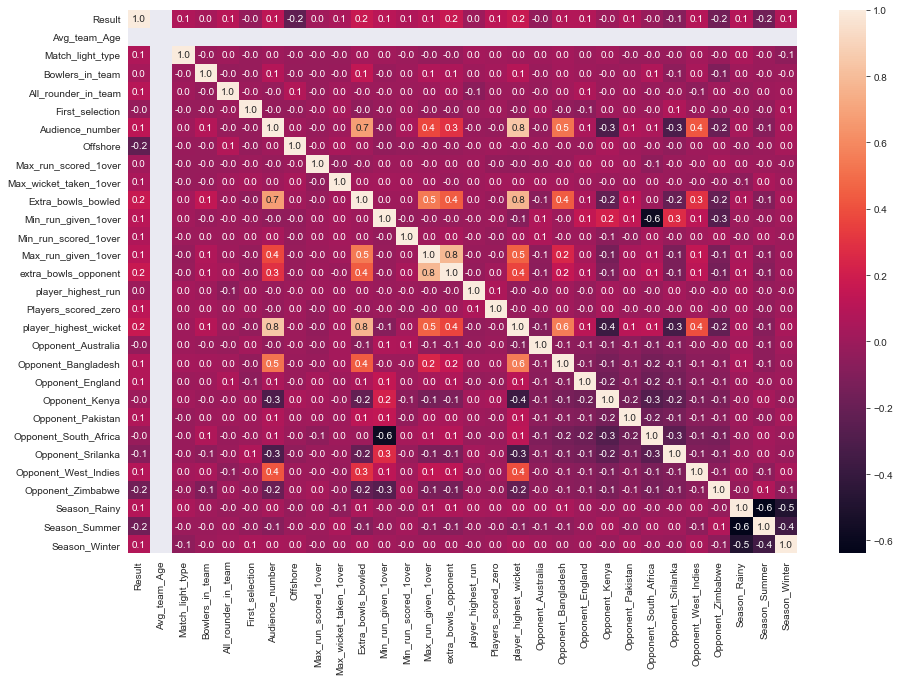

In [304]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), annot=True, fmt=".1f",square=False)